In [1]:
import numpy as np
from numpy.random import uniform, normal, choice

In [2]:
from flat import document, shape, rgba
from bezmerizing import Polyline
import random 
import math
from random import choice 
from random import sample

In [3]:
from IPython.display import SVG, display
def show(page):
    display(SVG(page.svg()))

In [4]:
from scipy.stats import truncnorm
def t_normal(a, b, mu, sigma):
    tn = truncnorm((a-mu)/sigma, (b-mu)/sigma, loc=mu, scale=sigma)
    return tn.rvs(1)[0]

In [5]:
!curl -L -O https://raw.githubusercontent.com/aparrish/chars74k-json-dump/master/char74k-normalized.json

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 3780k  100 3780k    0     0  2645k      0  0:00:01  0:00:01 --:--:-- 2645k


In [6]:
import json
chars = json.load(open("char74k-normalized.json"))

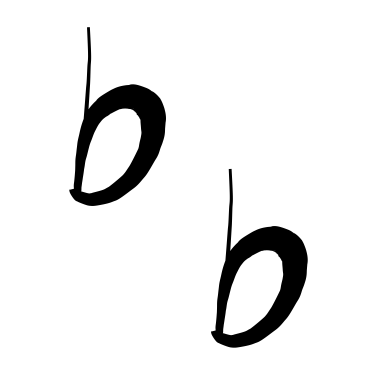

In [63]:
d = document(100, 100, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 255))
#figure2 = shape().nostroke().fill(rgba(0, 0, 0, 255))
form = choice(chars["b"])
x = 40
y = 40
for stroke in form:
    line = Polyline(stroke).augment().scale(0.2).translate(x, 40)
    curve = line.fancy_curve(samples_per=100, 
                             thicknesses=[1, 3, 10, 3], 
                             tightness=-0.1)
    lines = figure.polyline(curve)
    lines2 = figure.polygon(curve.translate(50,50))
    page.place(lines)
    page.place(lines2)
show(page)

In [12]:
d = document(240, 240, 'mm')
page = d.addpage()
figure = shape().nostroke().fill(rgba(0, 0, 0, 200))
figure2 = shape().nostroke().fill(rgba(255, 0, 0, 255))
form = choice(chars["b"])
form2 = choice(chars["b"])

line_figure = shape().fill(rgba(200, 220, 0, 255,)).stroke(rgba(0, 0, 0, 255,))
chord = line_figure.line(5, 10, 330, 10)
chord2 = line_figure.line(5, 15, 330, 15)
chord3 = line_figure.line(5, 20, 330, 20)
chord4 = line_figure.line(5, 25, 330, 25)
chord5 = line_figure.line(5, 30, 330, 30)
chord6 = line_figure.line(5, 35, 330, 35)


pts = []
for i in range(30):
    pts.append([int(uniform(10,300)), int(uniform(40, 300))])
    pline = Polyline(pts)
    
curve_poly = pline.fancy_curve(samples_per=24, thicknesses=[0, 2, 10, 2, 8, 2])
curve_path = pline.smooth_path()
curve_figure = shape().stroke(rgba(0, 0, 0, 150)).width(2)
curves = curve_figure.path(curve_path)
fancy_poly = curve_figure.polygon(curve_poly)

minPos = 30
maxPos = 220
for i in range(50):
    x = random.randint(minPos - 25,maxPos)
    y = random.randint(minPos,maxPos)
    for stroke in form:
        line = Polyline(stroke).augment().scale(0.05)
        curve = line.fancy_curve(samples_per=15, 
                                 thicknesses=[1, 3, 5, 1], 
                                 tightness=-0.1)
        lines = figure.polyline(curve.translate(x*1.5 ,y*1.2))
        page.place(lines)
        
#     for stroke in form2:
#         line2 = Polyline(stroke).augment().scale(0.01)
#         curve2 = line2.fancy_curve(samples_per=15, 
#                                  thicknesses=[1, 3, 2, 1], 
#                                  tightness=-0.1)
#         lines2 = figure2.polyline(curve2.translate(x*1.5 ,y*.17))
#         page.place(lines2)

page.place(chord)
page.place(chord2)
page.place(chord3)
page.place(chord4)
page.place(chord5)
page.place(chord6)

page.place(curves)
page.place(fancy_poly)
show(page)

In [27]:
d = document(240, 240, 'mm')
page = d.addpage()
form = choice(chars["b"])

figure = shape().nostroke().fill(rgba(0, 0, 0, 200))

pts = []
for i in range(25):
    pts.append([int(uniform(20,120)), int(uniform(40, 300))])
    pline = Polyline(pts)


    
    
for item in pts:
    x = 300 - item[0]
    for stroke in form:
        line = Polyline(stroke).augment().scale(0.05)
        curve = line.fancy_curve(samples_per=15, 
                                 thicknesses=[1, 3, 5, 1], 
                                 tightness=-0.1)
        lines = figure.polyline(curve.translate(item[0], item[1]))
        lines2 = figure.polyline(curve.translate(x, item[1]))
        page.place(lines)
        page.place(lines2)
    
    
curve_poly = pline.fancy_curve(samples_per=15, thicknesses=[0, 2, 10, 2, 8, 2])
curve_path = pline.smooth_path()
curve_figure = shape().stroke(rgba(0, 0, 0, 150)).width(2)

curves = curve_figure.path(curve_path)
fancy_poly = curve_figure.polygon(curve_poly)



page.place(curves)
page.place(fancy_poly)

show(page)

In [28]:
pline

Polyline([[109.0000, 201.0000], [100.0000, 210.0000], [62.0000, 174.0000], [102.0000, 256.0000], [100.0000, 297.0000], [60.0000, 297.0000], [80.0000, 287.0000], [92.0000, 76.0000], [76.0000, 145.0000], [39.0000, 149.0000], [47.0000, 231.0000], [115.0000, 82.0000], [63.0000, 151.0000], [84.0000, 280.0000], [85.0000, 166.0000], [84.0000, 95.0000], [79.0000, 200.0000], [53.0000, 219.0000], [40.0000, 255.0000], [35.0000, 239.0000], [64.0000, 290.0000], [58.0000, 298.0000], [53.0000, 123.0000], [100.0000, 148.0000], [93.0000, 93.0000]])

In [25]:
def merge(newX, newY): 
      
    merged_list = [(mirrorX[i], mirrorY[i]) for i in range(0, len(mirrorX))] 
    return merged_list 
      
mirrorCurve = merge(mirrorX, mirrorY)
mirrorCurve

[(214, 47),
 (261, 224),
 (206, 111),
 (197, 287),
 (232, 129),
 (211, 138),
 (187, 116),
 (214, 48),
 (225, 78),
 (192, 243),
 (270, 240),
 (196, 182),
 (210, 97),
 (221, 40),
 (218, 180)]

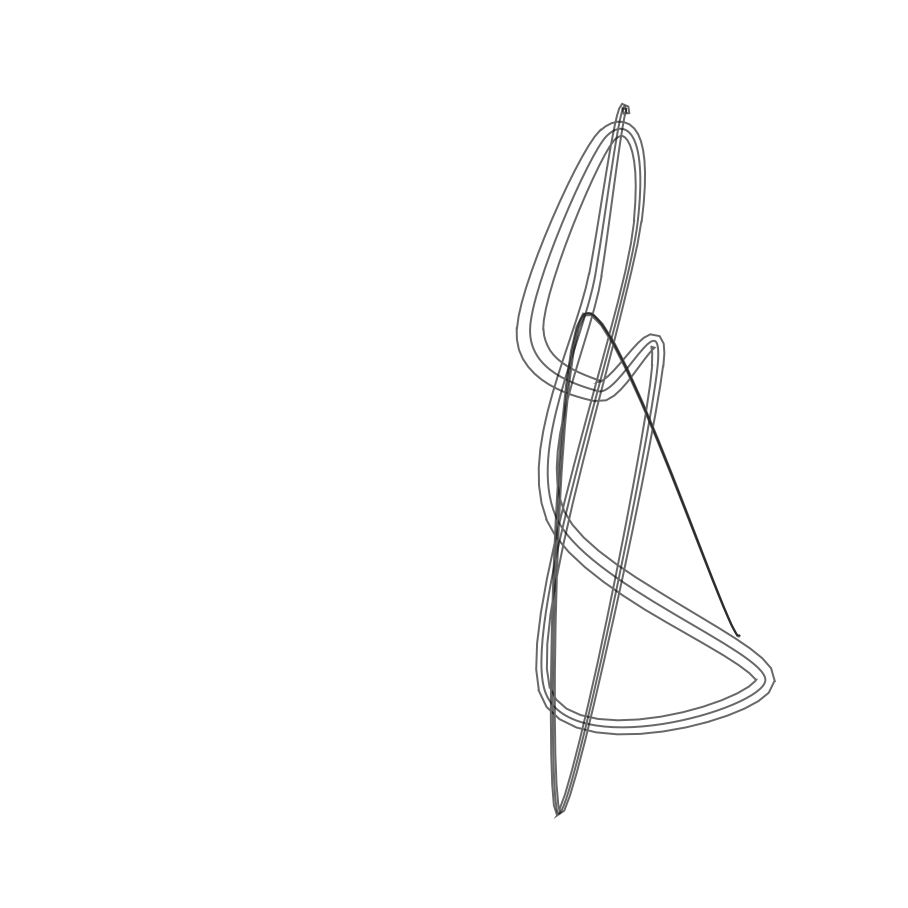

In [26]:
d = document(240, 240, 'mm')
page = d.addpage()

pline2 = Polyline(mirrorCurve)

curve_poly2 = pline2.fancy_curve(samples_per=15, thicknesses=[0, 2, 10, 2, 8, 2])
curve_path2 = pline2.smooth_path()
curve_figure2 = shape().stroke(rgba(0, 0, 0, 150)).width(2)

curves2 = curve_figure2.path(curve_path2)
fancy_poly2 = curve_figure2.polygon(curve_poly2)



page.place(curves2)
page.place(fancy_poly2)
show(page)

In [130]:
d = document(240, 240, 'mm')
page = d.addpage()


figure = shape().nostroke().fill(rgba(0, 0, 0, 150))
line_figure = shape().fill(rgba(200, 220, 0, 255,)).stroke(rgba(0, 0, 0, 255,))

y = 5
for lineY in range(6):
    y += 5
    chord = line_figure.line(5, y, 330, y)
    page.place(chord)


pts = []
for i in range(10):
    pts.append([int(uniform(10,200)), int(uniform(40, 300))])
    mirrorX = [300 - i[0] for i in pts]
    mirrorY = [i[1] for i in pts]
    mirrorCurve = merge(mirrorX, mirrorY)
    pline = Polyline(pts)
    pline2 = Polyline(mirrorCurve)
    
    
for item in pts:
    form = choice(chars["x"])
    for stroke in form:
        line = Polyline(stroke).augment().scale(0.05)
        curve = line.fancy_curve(samples_per=25, 
                                 thicknesses=[1, 3, 5, 1], 
                                 tightness=-0.1)
        lines = figure.polyline(curve.translate(item[0], item[1]))
        lines2 = figure.polyline(curve.translate(300-item[0], item[1]))
        page.place(lines)
        page.place(lines2)
        
minPos = 30
maxPos = 220
for i in range(40):
    form2 = choice(chars["p"])
    x = random.randint(minPos - 25,maxPos)
    y = random.randint(minPos,maxPos)      
    for stroke in form2:
        line2 = Polyline(stroke).augment().scale(0.01)
        curve2 = line2.fancy_curve(samples_per=15, 
                                 thicknesses=[1, 3, 5, 1], 
                                 tightness=-0.1)
        lines2 = figure2.polyline(curve2.translate(x*1.5 ,y*.17))
        page.place(lines2)

    
    
curve_poly = pline.fancy_curve(samples_per=40, thicknesses=[0, 2, 5, 2, 8, 0], tightness=-0.25)
curve_path = pline.smooth_path()
curve_figure = shape().nostroke().fill(rgba(0, 0, 0, 150))

fancy_poly = curve_figure.polygon(curve_poly)

curve_poly2 = pline2.fancy_curve(samples_per=40, thicknesses=[0, 2, 5, 2, 8, 0], tightness=-0.25)
curve_path2 = pline2.smooth_path()
curve_figure2 = shape().nostroke().fill(rgba(0, 0, 0, 150))

fancy_poly2 = curve_figure2.polygon(curve_poly2)

page.place(fancy_poly)
page.place(fancy_poly2)


show(page)